# 2D Object Detection for Autonomous Vehicles Using Transfer Learning


## Importing the Libraries


In [ ]:
import torch
import tensorflow as tf
from IPython.display import Image, clear_output
from keras.preprocessing.image import ImageDataGenerator
from google.colab import drive

## Checking requirements

In [ ]:
# verify CUDA
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [ ]:
# verify Tensorflow
tf.__version__

'2.8.0'

## Cloning the Yolov5 source code

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 10926, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 10926 (delta 0), reused 3 (delta 0), pack-reused 10923
Receiving objects: 100% (10926/10926), 11.02 MiB | 26.73 MiB/s, done.
Resolving deltas: 100% (7549/7549), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.6 MB/s 


## Importing the dataset

In [ ]:
%cd ..
drive.mount('/content/gdrive')

/content
Mounted at /content/gdrive


In [ ]:
# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

In [ ]:
# this is where my datasets are stored within my Google Drive (I created a yolov5 folder to store all important files for custom training) 
!ls /mydrive/AutonomousVehicle

Train.zip


In [ ]:
# copy over both datasets into the root directory of the Colab VM 
!cp /mydrive/AutonomousVehicle/Train.zip ../

In [ ]:
# unzip the datasets and their contents so that they are now in /content/data/ folder
!unzip ../Train.zip -d data/

Streaming output truncated to the last 5000 lines.
  inflating: data/Train/Auto/00000169.txt  
  inflating: data/Train/Auto/00000170.jpg  
  inflating: data/Train/Auto/00000170.txt  
  inflating: data/Train/Auto/00000171.jpg  
  inflating: data/Train/Auto/00000171.txt  
  inflating: data/Train/Auto/00000172.jpg  
  inflating: data/Train/Auto/00000172.txt  
  inflating: data/Train/Auto/00000173.jpg  
  inflating: data/Train/Auto/00000173.txt  
  inflating: data/Train/Auto/00000174.jpg  
  inflating: data/Train/Auto/00000174.txt  
  inflating: data/Train/Auto/00000175.jpg  
  inflating: data/Train/Auto/00000175.txt  
  inflating: data/Train/Auto/00000176.jpg  
  inflating: data/Train/Auto/00000176.txt  
  inflating: data/Train/Auto/00000177.jpg  
  inflating: data/Train/Auto/00000177.txt  
  inflating: data/Train/Auto/00000178.jpg  
  inflating: data/Train/Auto/00000178.txt  
  inflating: data/Train/Auto/00000179.jpg  
  inflating: data/Train/Auto/00000179.txt  
  inflating: data/Train/A

## Preprocessing the data

In [ ]:
# Initialising the Data Generator class to augment Images
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.3,
    zoom_range=-0.4,
    rotation_range=10,
    channel_shift_range = 10,
    horizontal_flip=True
)

# Create 3 augmented images for every image in the Training set
for x, val in zip(train_datagen.flow_from_directory(
        '/content/data/Train',
        target_size=(256, 256),
        batch_size=32,
        class_mode='binary',
        save_to_dir='/content/data/Train',
        save_prefix='aug',
        save_format='jpg',
), range(3)) : pass

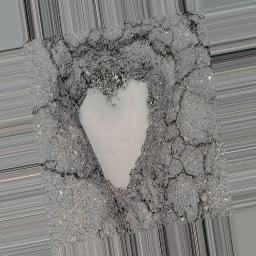

In [ ]:
# Viewing Augmented Images
Image(filename='/content/results/aug_7_7150142.jpg', width='320')

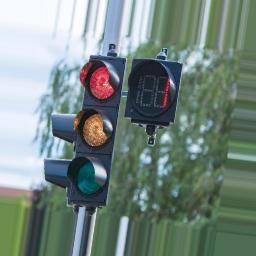

In [ ]:
Image(filename='/content/results/aug_91_6377912.jpg', width='320')

## Training Yolov5 model on custom dataset

In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
!python train.py --img 416 --batch 16 --epochs 75 --data autonomous.yaml --weights yolov5l.pt --cache

train: weights=yolov5l.pt, cfg=, data=autonomous.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=75, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-274-gc43f135 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0

## Viewing the results

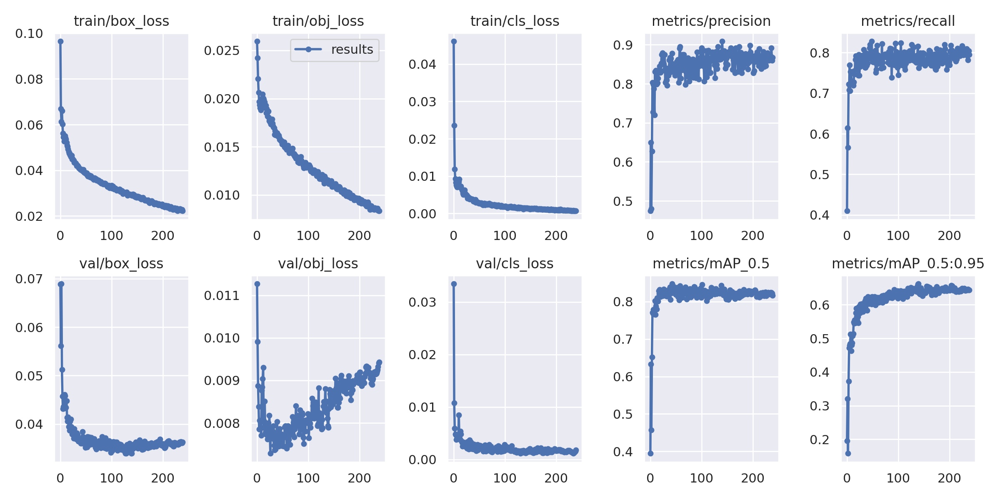

In [ ]:
Image(filename='/content/results/results.png', width='1000')

GROUND TRUTH TRAINING DATA:


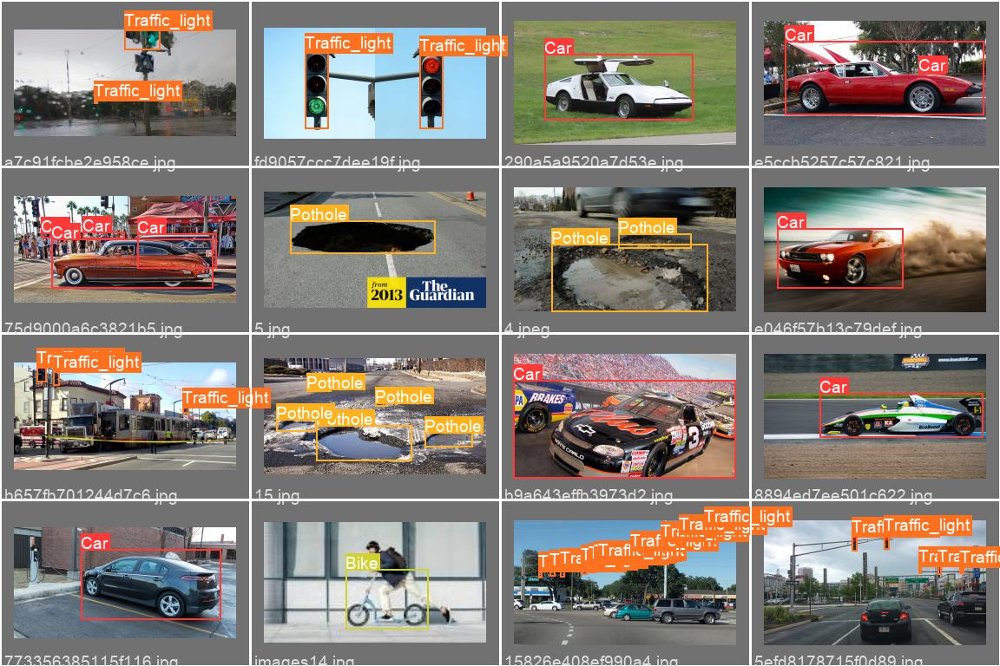

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/results/val_batch0_labels.jpg', width='1000')

GROUND TRUTH AUGMENTED TRAINING DATA:


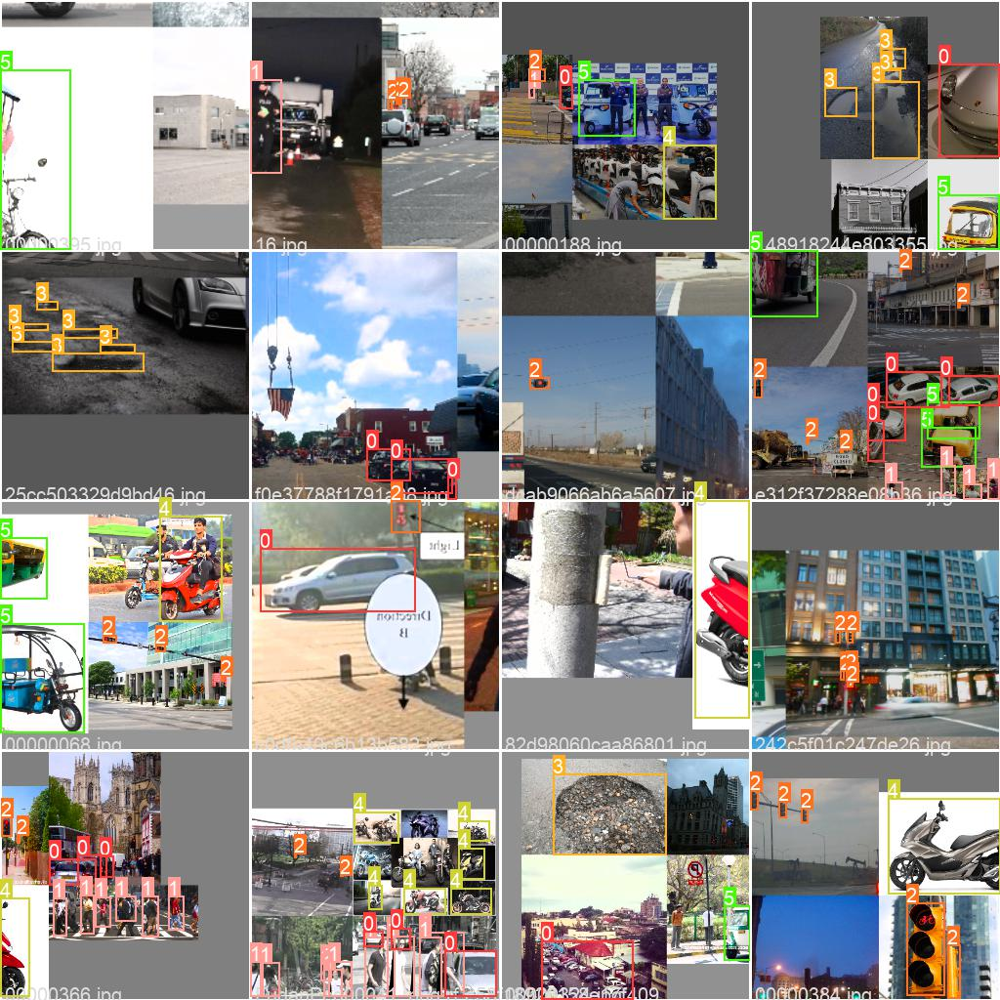

In [ ]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/results/train_batch0.jpg', width='1000')

Predictions:


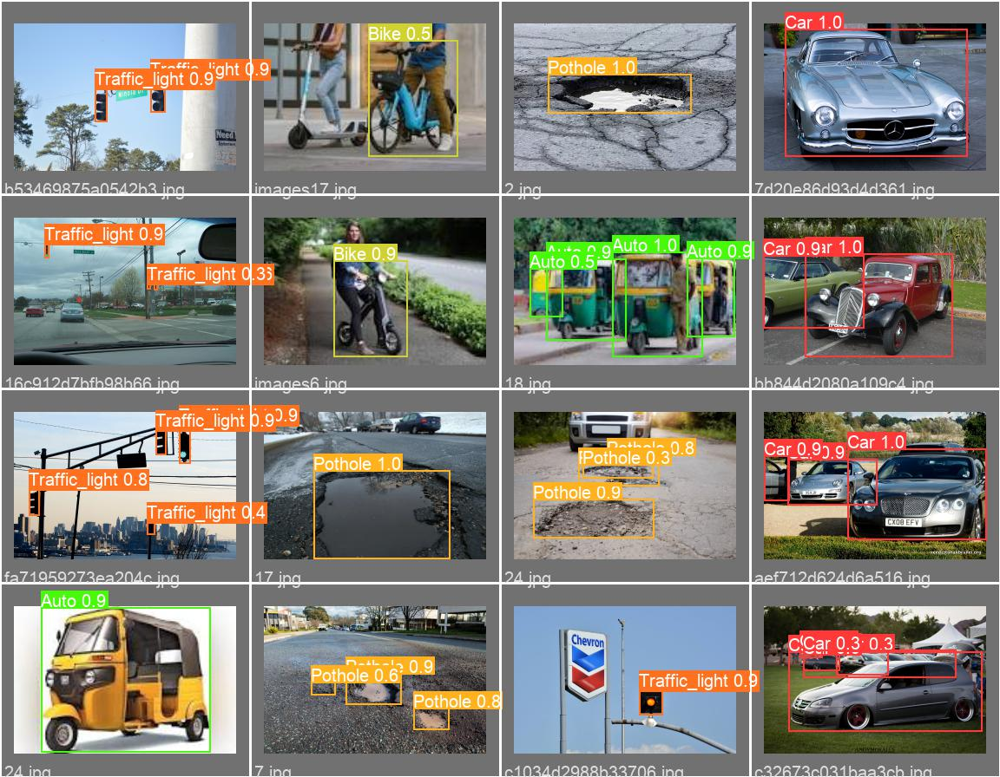

In [ ]:
print("Predictions:")
Image(filename='/content/results/val_batch1_pred.jpg', width='1000')

## Detection Using Custom Weights

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 256 --source /content/yolov5/data/images/test3.jpg

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/data/images/test3.jpg, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-237-gdc7e093 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 444 layers, 86207059 parameters, 0 gradients, 204.1 GFLOPs
image 1/1 /content/yolov5/data/images/test3.jpg: 160x256 3 Autos, Done. (0.030s)
Speed: 0.2ms pre-process, 30.4ms inference, 1.8ms NMS per image at shape (1, 3, 256, 256)
Results saved to runs/detect/exp4


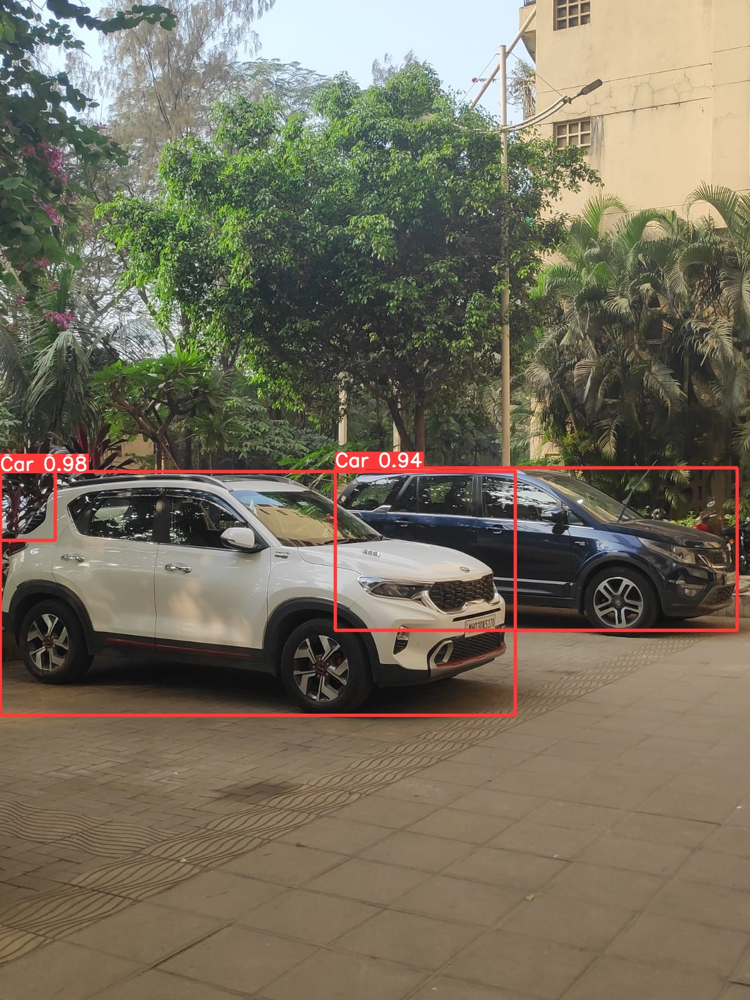

In [ ]:
Image(filename='/content/results/w1.jpeg', width='614')

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/results/demovd1.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Saving custom weights for predictions


In [ ]:
!zip -r /content/file.zip /content/yolov5/runs/train/exp

  adding: content/yolov5/runs/train/exp/ (stored 0%)
  adding: content/yolov5/runs/train/exp/train_batch2.jpg (deflated 2%)
  adding: content/yolov5/runs/train/exp/events.out.tfevents.1644495574.4de3a1c7582c.343.0 (deflated 93%)
  adding: content/yolov5/runs/train/exp/labels.jpg (deflated 14%)
  adding: content/yolov5/runs/train/exp/train_batch1.jpg (deflated 3%)
  adding: content/yolov5/runs/train/exp/hyp.yaml (deflated 44%)
  adding: content/yolov5/runs/train/exp/opt.yaml (deflated 42%)
  adding: content/yolov5/runs/train/exp/labels_correlogram.jpg (deflated 24%)
  adding: content/yolov5/runs/train/exp/train_batch0.jpg (deflated 3%)
  adding: content/yolov5/runs/train/exp/results.csv (deflated 82%)
  adding: content/yolov5/runs/train/exp/weights/ (stored 0%)
  adding: content/yolov5/runs/train/exp/weights/last.pt (deflated 7%)
  adding: content/yolov5/runs/train/exp/weights/best.pt (deflated 7%)


In [ ]:
from google.colab import files
files.download("/content/file.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>